# Gaussian Mixture Modeling Regimes

In [2]:
from sklearn.mixture import GaussianMixture
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
residuals = pd.read_csv('../data/manipulated/pr_filtered_residuals.csv')
cointegration_pairs = pd.read_csv('../data/manipulated/cointegrated_pairs.csv')

In [4]:
cointegration_pairs.head()

,asset_a,asset_b,pvalue,beta
0,HPQ,WY,0.0,0.761159
1,HPQ,KKR,0.0,0.798825
2,FTV,AVY,0.0,1.036690
3,HPQ,SBUX,0.0,0.933152
4,KKR,AVY,0.0,0.917810


In [12]:
def select_best_k(
    spread: pd.Series,
    k_range: range = [2, 3, 4, 5],
    ) -> int:
    """
    Select the optimal number of GMM components using BIC.

    Lower BIC => better model.

    Args:
        spread:  1D spread time series (training portion only).
        k_range: Range of k values to evaluate.

    Returns:
        best_k:  Optimal number of components.
        bic_scores: List of (k, bic) tuples for all tested values.
    """
    X = spread.values.reshape(-1, 1)
    bic_scores = []

    for k in k_range:
        gmm = GaussianMixture(
            n_components=k,
            covariance_type="full",
            random_state=42,
            n_init=5,          # multiple initialisations for stability
        )
        gmm.fit(X)
        bic_scores.append((k, gmm.bic(X)))

    best_k = min(bic_scores, key=lambda x: x[1])[0]
    return best_k

In [10]:
def fit_gmm(
    spread: pd.Series,
    n_components: int,
) -> GaussianMixture:
    """
    Fit a GaussianMixture model to a spread series.

    Args:
        spread:       1D spread time series (training portion only).
        n_components: Number of Gaussian components (regimes).

    Returns:
        Fitted GaussianMixture object.
    """
    X = spread.values.reshape(-1, 1)
    gmm = GaussianMixture(
        n_components=n_components,
        covariance_type="full",
        random_state=42,
        n_init=5,
    )
    gmm.fit(X)
    return gmm

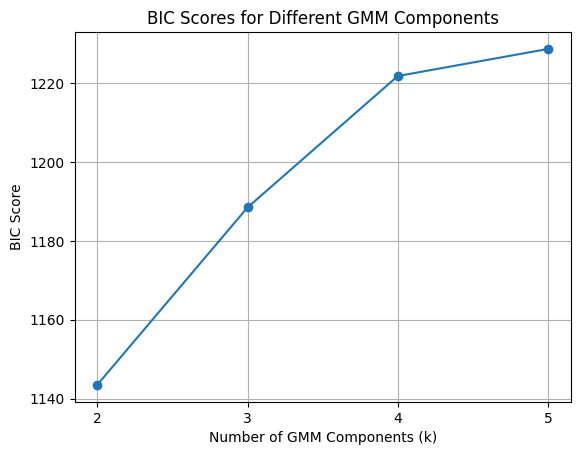

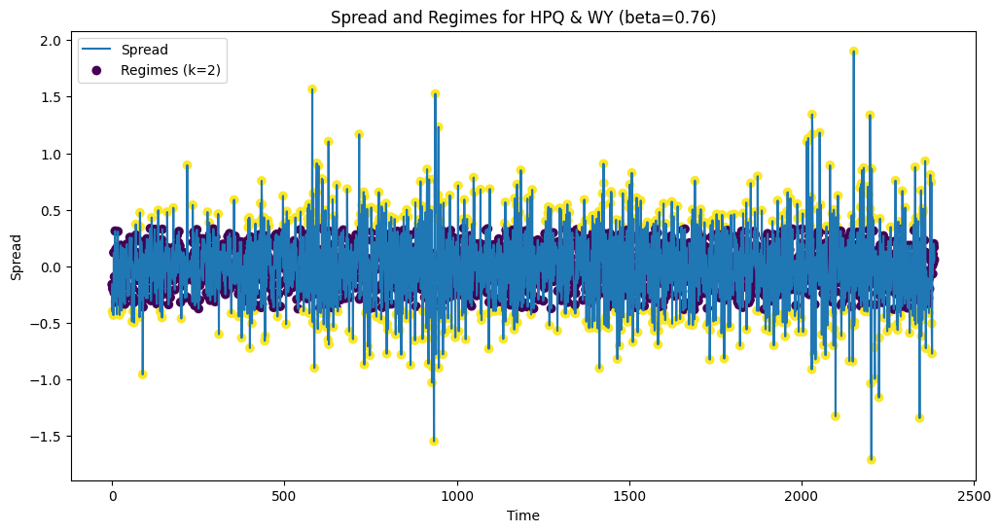

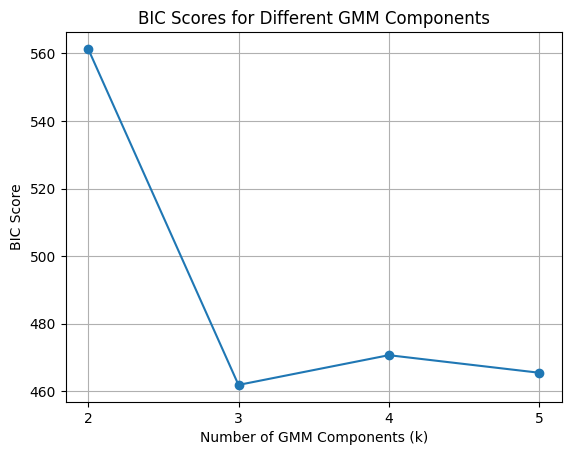

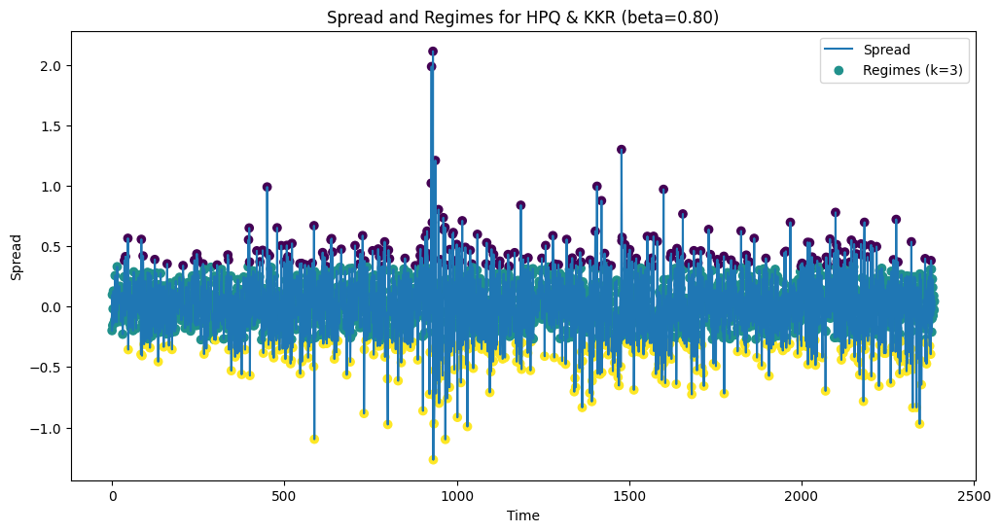

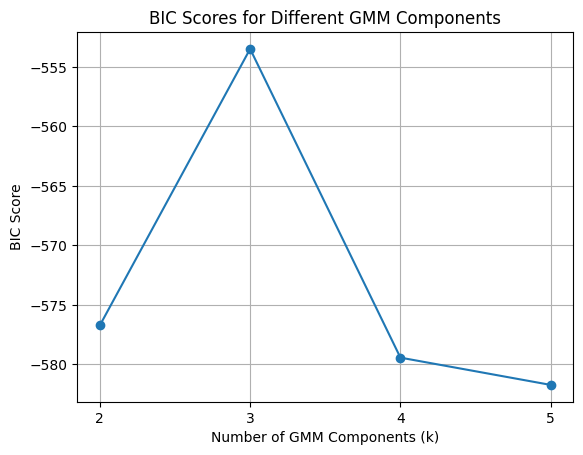

...

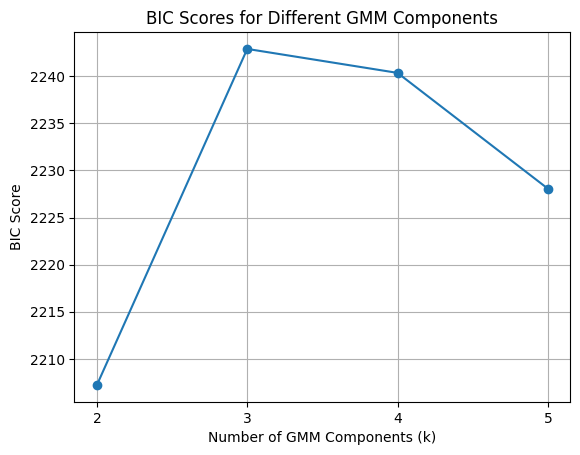

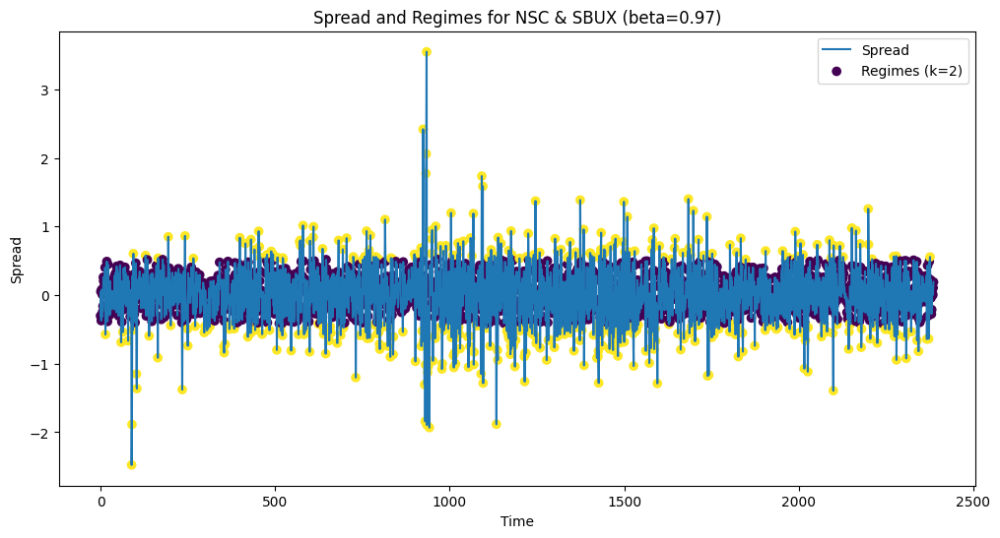

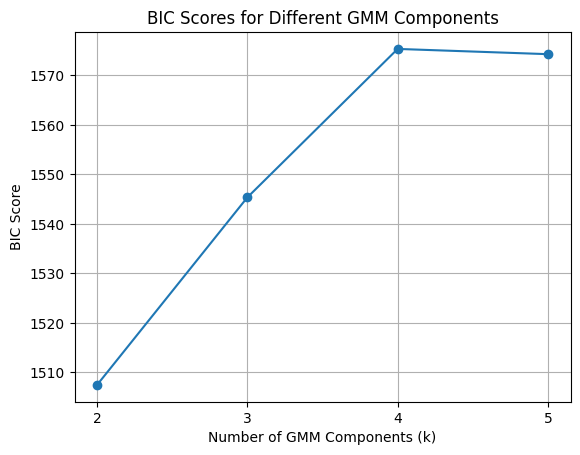

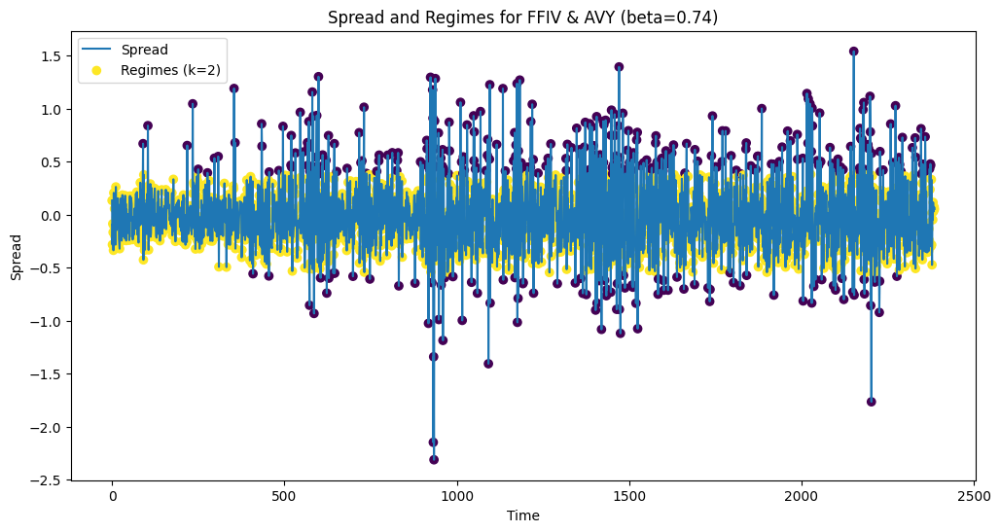

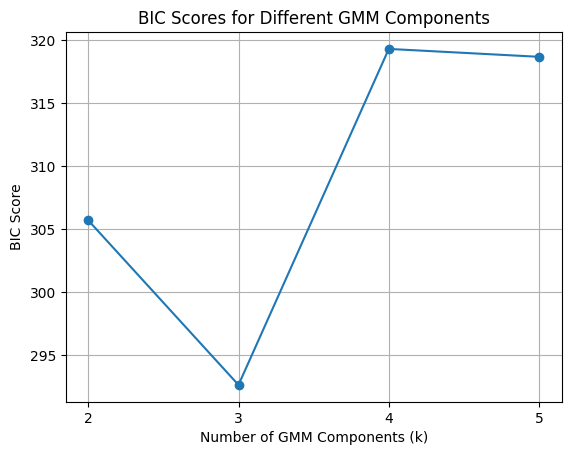

KeyboardInterrupt: 

In [11]:
for i, row in cointegration_pairs.iterrows():
    a = row['asset_a']
    b = row['asset_b']
    beta = row['beta']
    
    spread = residuals[a] - beta * residuals[b]

    best_k = select_best_k(spread)
    gmm = fit_gmm(spread, best_k)

    regimes = gmm.predict(spread.values.reshape(-1, 1))
    plt.figure(figsize=(12, 6))
    plt.plot(spread.index, spread.values, label='Spread')
    plt.scatter(spread.index, spread.values, c=regimes, label=f'Regimes (k={best_k})', cmap='viridis', marker='o')
    plt.title(f'Spread and Regimes for {a} & {b} (beta={beta:.2f})')
    plt.xlabel('Time')
    plt.ylabel('Spread')
    plt.legend()
    plt.show()

In [22]:
for _, row in cointegration_pairs.iterrows():
    a, b, beta = row['asset_a'], row['asset_b'], row['beta']

    spread = residuals[a] - beta * residuals[b]

    best_k = select_best_k(spread)
    gmm = fit_gmm(spread, best_k)

    labels = gmm.predict(spread.values.reshape(-1, 1))

    # sort regimes by mean for consistent labeling across pairs
    sorted_idx = np.argsort(gmm.means_.flatten())
    remap = {old: new for new, old in enumerate(sorted_idx)}
    sorted_labels = np.array([remap[l] for l in labels])

    # z-score relative to assigned regime
    means = gmm.means_.flatten()[sorted_idx]
    stds  = np.sqrt(gmm.covariances_.flatten()[sorted_idx])

    z_scores = np.array([
        (spread.iloc[i] - means[sorted_labels[i]]) / stds[sorted_labels[i]]
        for i in range(len(spread))
    ])

    df = pd.DataFrame({
        'spread':  spread.values,
        'regime':  sorted_labels,
        'z_score': z_scores,
    }, index=spread.index)

    df['signal'] = 0
    df.loc[df['z_score'] < -2,  'signal'] =  1   # long
    df.loc[df['z_score'] >  2,  'signal'] = -1   # short
    df.loc[df['z_score'].abs() < 0.5, 'signal'] =  0   # exit

    filename = f"{a}_{b}.csv"
    df.to_csv('../data/manipulated/spreads/' + filename)

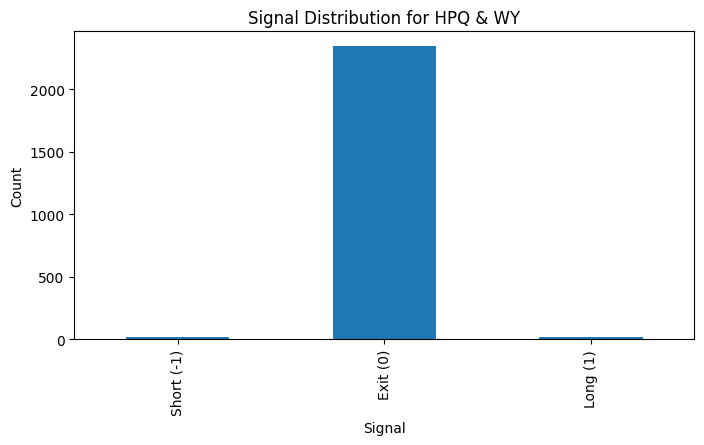

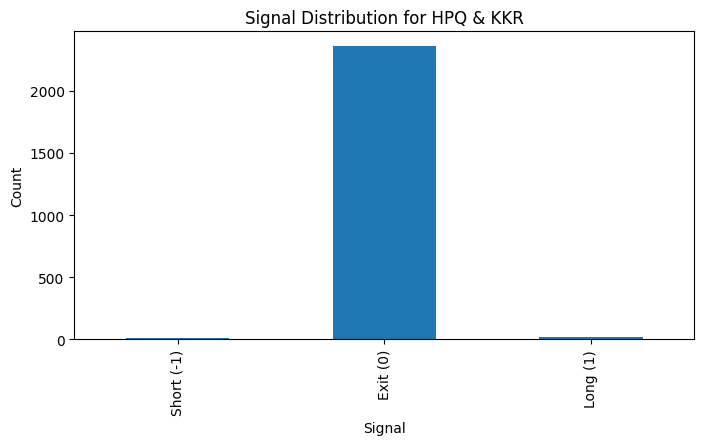

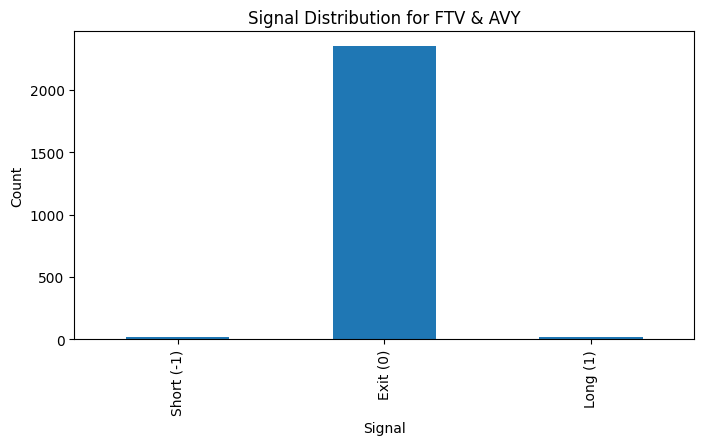

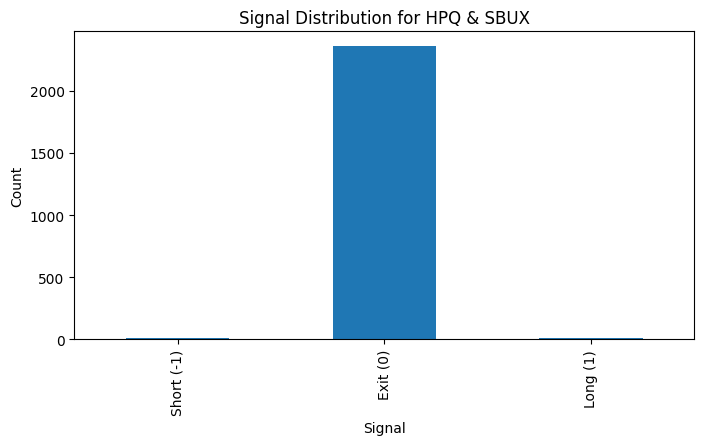

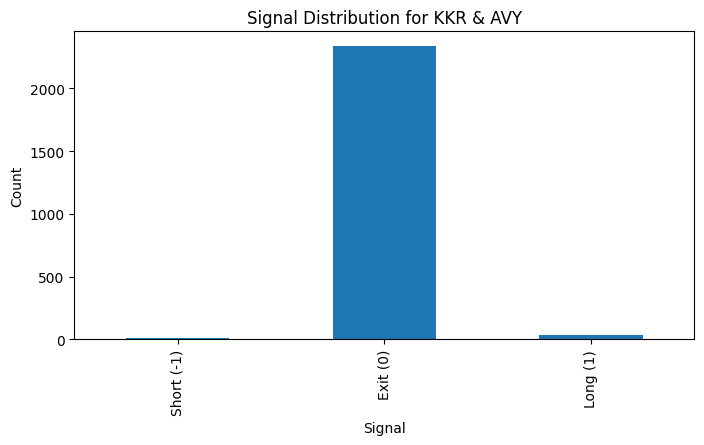

...

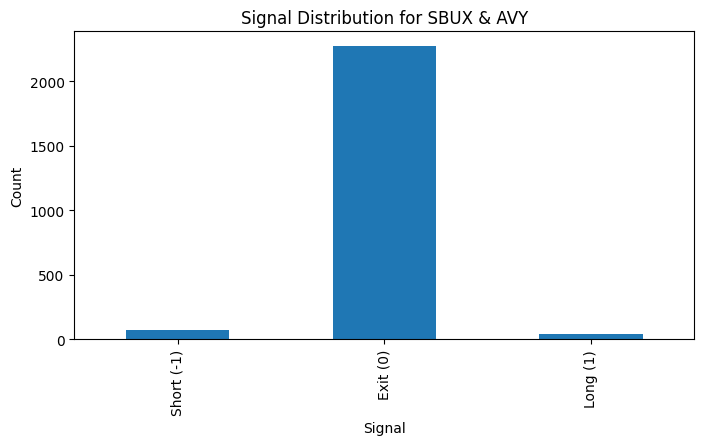

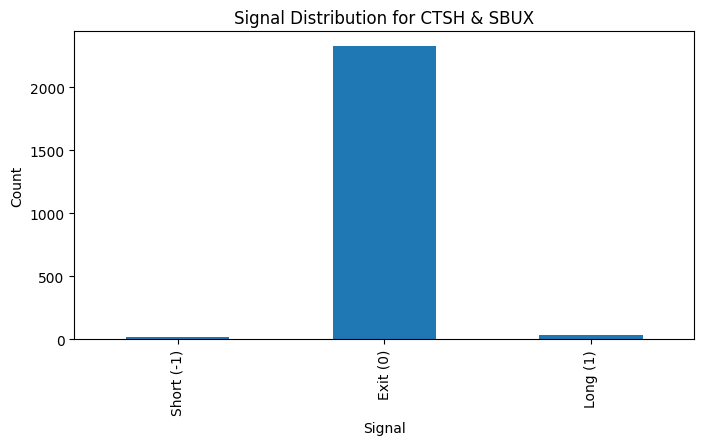

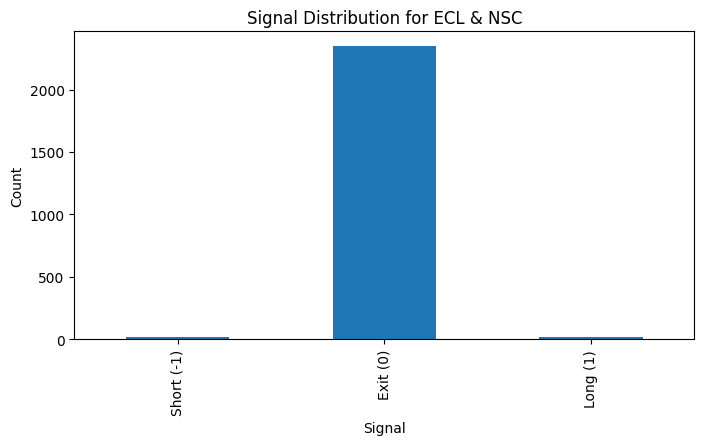

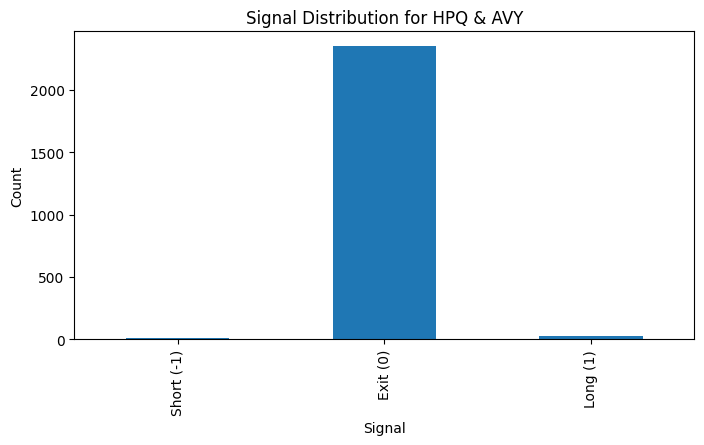

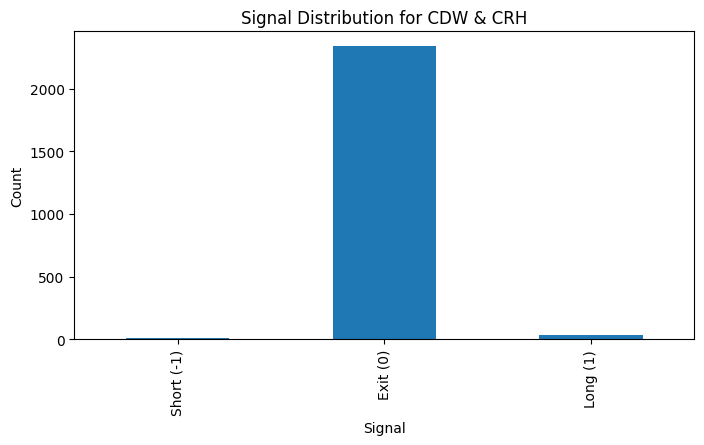

KeyboardInterrupt: 

In [26]:
for _, row in cointegration_pairs.iterrows():
    a, b = row['asset_a'], row['asset_b']
    filename = f"../data/manipulated/spreads/{a}_{b}.csv"
    df = pd.read_csv(filename, index_col=0)

    plt.figure(figsize=(8, 4))
    df['signal'].value_counts().sort_index().plot(kind='bar')
    plt.title(f'Signal Distribution for {a} & {b}')
    plt.xlabel('Signal')
    plt.ylabel('Count')
    plt.xticks(ticks=[0, 1, 2], labels=['Short (-1)', 'Exit (0)', 'Long (1)'])
    plt.show()

Not enough spreads are being classified as tradeable.

In [27]:
for _, row in cointegration_pairs.iterrows():
    filename = f"../data/manipulated/spreads/{row['asset_a']}_{row['asset_b']}.csv"
    df = pd.read_csv(filename, index_col=0)
    print(f'Z-Score Statistics for {row["asset_a"]} & {row["asset_b"]}:')
    print(df['z_score'].describe())
    print(df['z_score'].abs().quantile([0.8, 0.9, 0.95, 0.99]))
    print()

Z-Score Statistics for HPQ & WY:
count    2387.000000
mean        0.020086
std         0.983050
min        -4.106371
25%        -0.794002
50%         0.052777
75%         0.840487
max         4.466093
Name: z_score, dtype: float64
0.80    1.267042
0.90    1.489100
0.95    1.634710
0.99    2.178818
Name: z_score, dtype: float64

Z-Score Statistics for HPQ & KKR:
count    2387.000000
mean       -0.015753
std         0.935943
min        -3.799271
25%        -0.694310
50%        -0.114471
75%         0.702236
max         6.097359
Name: z_score, dtype: float64
0.80    1.213059
0.90    1.480094
0.95    1.650951
0.99    2.061758
Name: z_score, dtype: float64

Z-Score Statistics for FTV & AVY:
count    2387.000000
mean        0.005658
std         0.839982
min        -2.752274
25%        -0.588004
50%         0.041947
75%         0.528597
max         3.171928
Name: z_score, dtype: float64
0.80    1.128057
0.90    1.376994
0.95    1.544934
0.99    2.180903
Name: z_score, dtype: float64

Z-Score 

The z-score statistics for most pairs appear to be approximately standard normal. The good news is that this means the GMM regimes are very well separated, meaning each spread within a regime looks normal to that regime. The bad news is that this means z-scoring within regimes is not feasible for signaling, so I will instead implement global z-scoring across all regimes and then use the regimes as volatility indicators, e.g. an extreme z-score + a stable regime means we expect the spread to stabilize.

For now, classify the lowest stdev regime as the calm one and trade in it only.

In [29]:
for _, row in cointegration_pairs.iterrows():
    a, b, beta = row['asset_a'], row['asset_b'], row['beta']
    
    spread = residuals[a] - beta * residuals[b]
    
    best_k = select_best_k(spread)
    gmm = fit_gmm(spread, best_k)
    
    labels = gmm.predict(spread.values.reshape(-1, 1))
    
    # sort regimes by mean for consistency
    sorted_idx = np.argsort(gmm.means_.flatten())
    remap = {old: new for new, old in enumerate(sorted_idx)}
    sorted_labels = np.array([remap[l] for l in labels])
    
    # global z-score
    z_scores = (spread - spread.mean()) / spread.std()
    
    # calm regime = lowest std after sorting
    sorted_stds = np.sqrt(gmm.covariances_.flatten())[sorted_idx]
    calm_regime = int(np.argmin(sorted_stds))
    
    # signals: only enter in calm regime
    signal = pd.Series(0, index=spread.index)
    signal[(z_scores < -1.5) & (sorted_labels == calm_regime)] =  1
    signal[(z_scores >  1.5) & (sorted_labels == calm_regime)] = -1
    signal[z_scores.abs() < 0.3] = 0
    
    df = pd.DataFrame({
        'spread':  spread.values,
        'regime':  sorted_labels,
        'z_score': z_scores,
        'signal':  signal,
    }, index=spread.index)
    
    filename = f"{a}_{b}.csv"
    df.to_csv('../data/manipulated/spreads/' + filename)

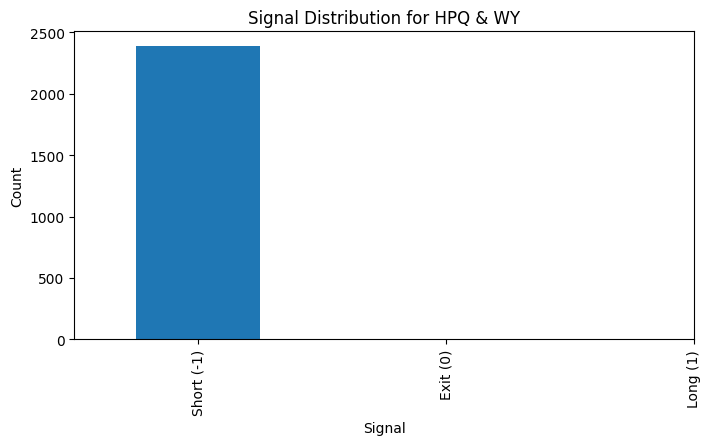

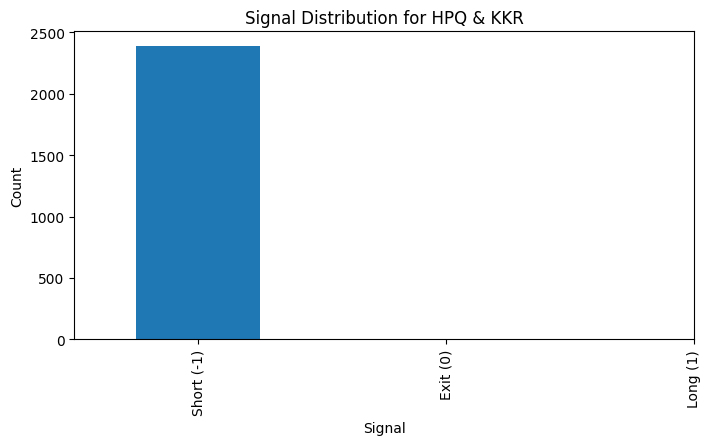

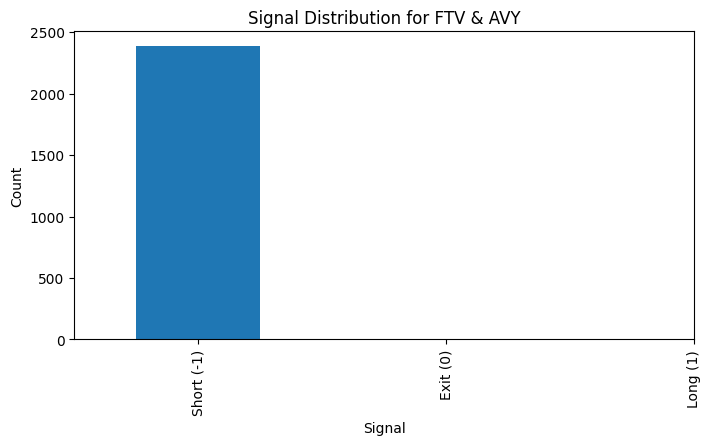

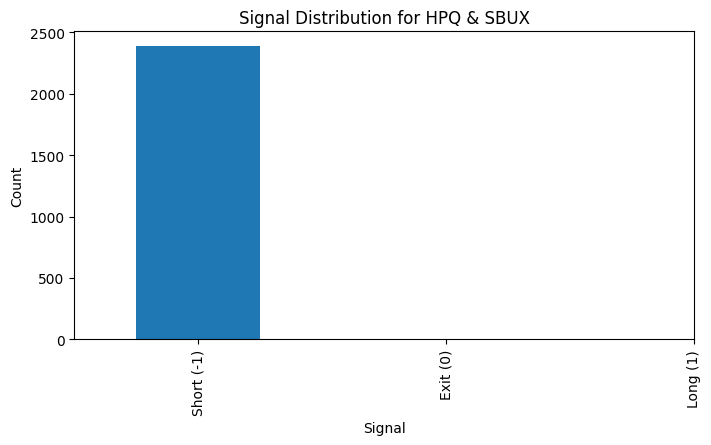

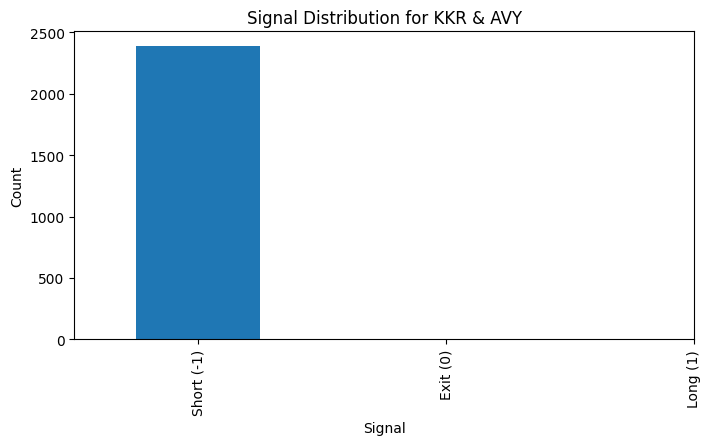

...

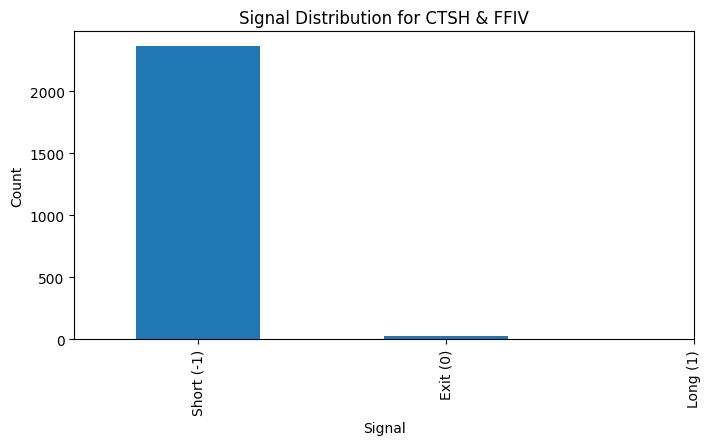

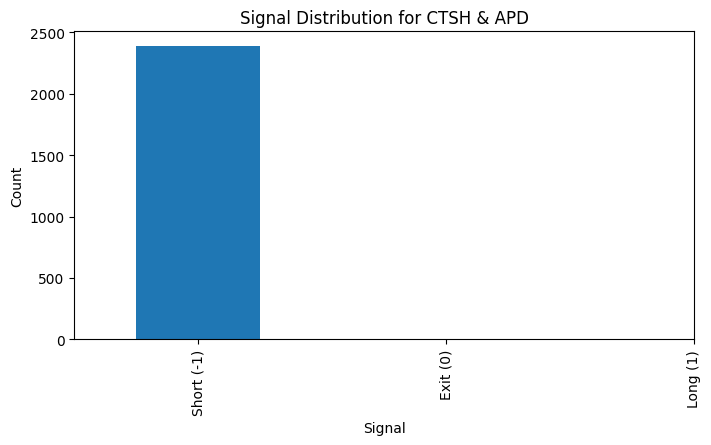

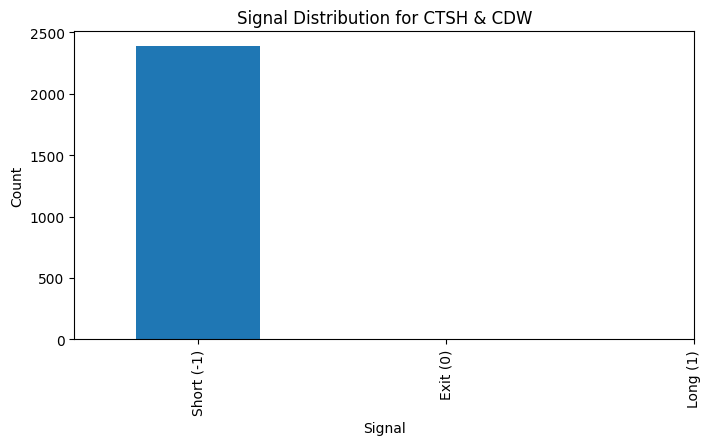

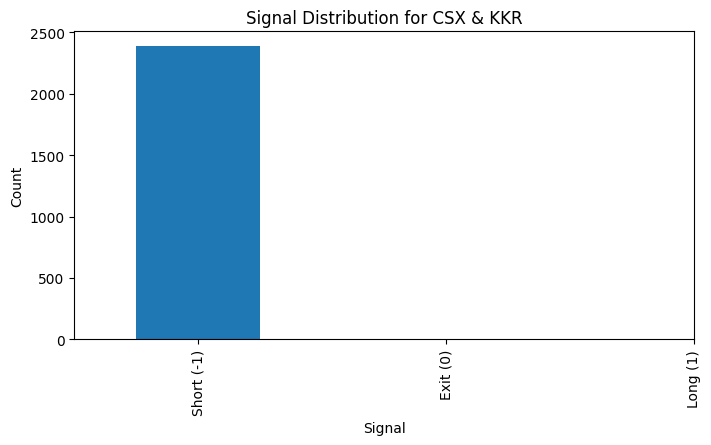

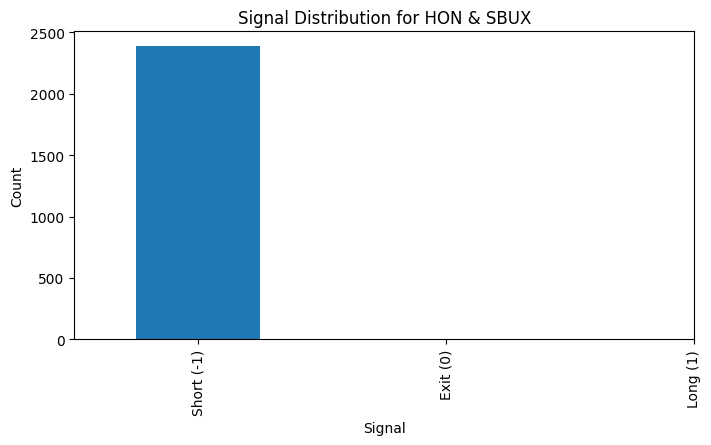

KeyboardInterrupt: 

In [ ]:
for _, row in cointegration_pairs.iterrows():
    a, b = row['asset_a'], row['asset_b']
    filename = f"../data/manipulated/spreads/{a}_{b}.csv"
    df = pd.read_csv(filename, index_col=0)

    plt.figure(figsize=(8, 4))
    df['signal'].value_counts().sort_index().plot(kind='bar')
    plt.title(f'Signal Distribution for {a} & {b}')
    plt.xlabel('Signal')
    plt.ylabel('Count')
    plt.xticks(ticks=[0, 1, 2], labels=['Short (-1)', 'Exit (0)', 'Long (1)'])
    plt.show()